In [1]:
import pandas as pd
import sqlite3
import matplotlib
import ipywidgets
import matplotlib.pyplot as plt
import regex as re
import bqplot
import numpy as np
import seaborn as sb

import plotly.graph_objects as go
import networkx as nx

In [2]:
principals = pd.read_csv('Imdb_data/title.principals.tsv',delimiter='\t')
basics = pd.read_csv('Imdb_data/title.basics.tsv',delimiter='\t')
imdb_names = pd.read_csv('Imdb_data/name.basics.tsv',delimiter='\t')

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
wiki_cast_excel = pd.read_csv('wiki_cast_excel.csv')
wiki_cast_excel.iloc[29]
wiki_cast = wiki_cast_excel.fillna('No')
wiki_cast

,Performer,Time on SNL,No. of seasons,Repertory Player,Featured Player,Middle Group,"""Weekend Update"" Anchor",Hosted,Writer
0,Fred Armisen,2002–2013,11,Yes,Yes,No,No,Yes,No
1,Aristotle Athari,2021–present,1,No,Yes,No,No,No,No
2,Dan Aykroyd,1975–1979,4,Yes,No,No,Yes,Yes,Yes
3,Peter Aykroyd,1980,1,No,Yes,No,No,No,Yes
4,Morwenna Banks,1995,1,Yes,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...
154,Casey Wilson,2008–2009,2,No,Yes,No,No,No,No
155,Fred Wolf,1996–1996,2,No,Yes,No,No,No,Yes
156,Bowen Yang,2019–present,3,Yes,Yes,No,No,No,Yes
157,Sasheer Zamata,2014–2017,4,Yes,Yes,No,No,No,No


Text(0, 0.5, 'No. of Seasons')

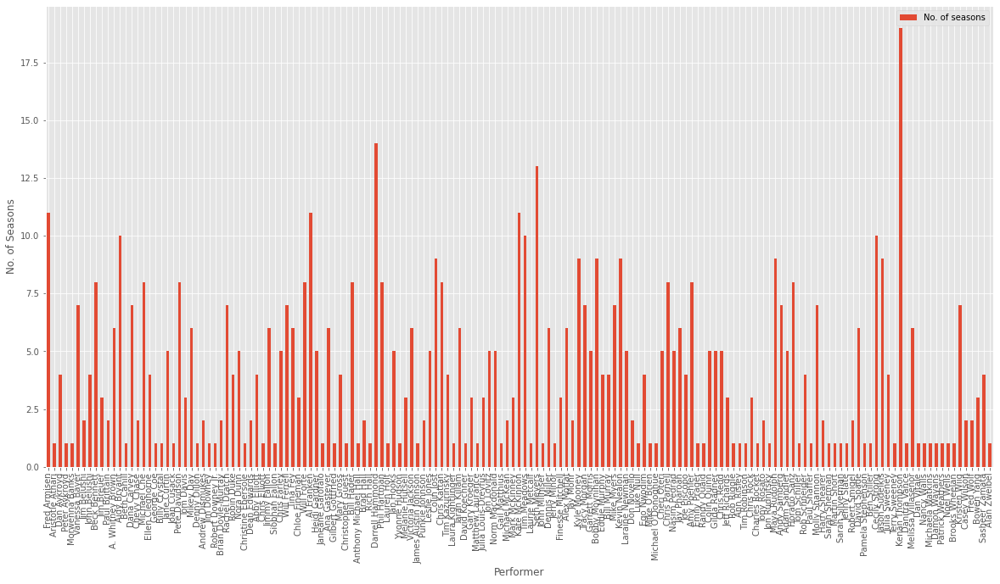

In [4]:
plt.style.use('ggplot')
ax = wiki_cast.plot(x= "Performer",y="No. of seasons", figsize = (20,10), kind = 'bar')
ax.set_ylabel('No. of Seasons')

In [5]:
imdb_names_df = imdb_names
imdb_names_df

,nconst,primaryName,birthYear,deathYear,primaryProfession,knownForTitles
0,nm0000001,Fred Astaire,1899,1987,"soundtrack,actor,miscellaneous","tt0050419,tt0053137,tt0031983,tt0072308"
1,nm0000002,Lauren Bacall,1924,2014,"actress,soundtrack","tt0071877,tt0037382,tt0117057,tt0038355"
2,nm0000003,Brigitte Bardot,1934,\N,"actress,soundtrack,music_department","tt0054452,tt0056404,tt0057345,tt0049189"
3,nm0000004,John Belushi,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455"
4,nm0000005,Ingmar Bergman,1918,2007,"writer,director,actor","tt0069467,tt0083922,tt0060827,tt0050986"
...,...,...,...,...,...,...
11554305,nm9993714,Romeo del Rosario,\N,\N,"animation_department,art_department","tt14069590,tt11657662,tt2455546"
11554306,nm9993716,Essias Loberg,\N,\N,NaN,\N
11554307,nm9993717,Harikrishnan Rajan,\N,\N,cinematographer,tt8736744
11554308,nm9993718,Aayush Nair,\N,\N,cinematographer,\N


In [6]:
imdb_name_list = imdb_names_df.values.tolist()
imdb_names_df.columns.tolist()

['nconst',
 'primaryName',
 'birthYear',
 'deathYear',
 'primaryProfession',
 'knownForTitles']

In [7]:
cross_imdb_wiki_list = []
for person in imdb_name_list:
    if person[1] in wiki_cast['Performer'].values:
        cross_imdb_wiki_list.append(person)

In [8]:
cross_name_list = (set([r[1] for r in cross_imdb_wiki_list]))
len(cross_name_list) # <- Missing 2 cast members

157

In [9]:
from collections import Counter

Counter([r[1] for r in cross_imdb_wiki_list]).most_common(10)

[('Tom Davis', 56),
 ("Mike O'Brien", 56),
 ('Bill Murray', 35),
 ('Tim Robinson', 32),
 ('Leslie Jones', 26),
 ('Chris Elliott', 24),
 ('Mike Myers', 23),
 ('Jeff Richards', 23),
 ('Dennis Miller', 21),
 ('Victoria Jackson', 18)]

In [10]:
cross_imdb_wiki_list

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000101',
  'Dan Aykroyd',
  '1952',
  '\\N',
  'writer,actor,producer',
  'tt0097428,tt0118747,tt0087332,tt0080455'],
 ['nm0000195',
  'Bill Murray',
  '1950',
  '\\N',
  'actor,soundtrack,writer',
  'tt1748122,tt0128445,tt0362270,tt0335266'],
 ['nm0000196',
  'Mike Myers',
  '1963',
  '\\N',
  'actor,writer,soundtrack',
  'tt0295178,tt0145660,tt0118655,tt0811138'],
 ['nm0000331',
  'Chevy Chase',
  '1943',
  '\\N',
  'actor,writer,soundtrack',
  'tt0085995,tt0097958,tt0080487,tt0092086'],
 ['nm0000345',
  'Billy Crystal',
  '1948',
  '\\N',
  'actor,writer,producer',
  'tt0101587,tt0098635,tt0113097,tt0122933'],
 ['nm0000349',
  'Joan Cusack',
  '1962',
  '\\N',
  'actress,soundtrack,writer',
  'tt0119229,tt1659337,tt0119360,tt0096463'],
 ['nm0000375',
  'Robert Downey Jr.',
  '1965',
  '\\N',
  'actor,producer,soundtrack',
  'tt1300854,tt0371746,tt4154

In [11]:
def check_names(name):
    cross_name_list = (set([r[1] for r in cross_imdb_wiki_list]))
    result = False
    
    if name in cross_name_list:
        result = True
    return result
SNL_name_check = [r for r in cross_imdb_wiki_list if check_names(r[1])]
(SNL_name_check)

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000101',
  'Dan Aykroyd',
  '1952',
  '\\N',
  'writer,actor,producer',
  'tt0097428,tt0118747,tt0087332,tt0080455'],
 ['nm0000195',
  'Bill Murray',
  '1950',
  '\\N',
  'actor,soundtrack,writer',
  'tt1748122,tt0128445,tt0362270,tt0335266'],
 ['nm0000196',
  'Mike Myers',
  '1963',
  '\\N',
  'actor,writer,soundtrack',
  'tt0295178,tt0145660,tt0118655,tt0811138'],
 ['nm0000331',
  'Chevy Chase',
  '1943',
  '\\N',
  'actor,writer,soundtrack',
  'tt0085995,tt0097958,tt0080487,tt0092086'],
 ['nm0000345',
  'Billy Crystal',
  '1948',
  '\\N',
  'actor,writer,producer',
  'tt0101587,tt0098635,tt0113097,tt0122933'],
 ['nm0000349',
  'Joan Cusack',
  '1962',
  '\\N',
  'actress,soundtrack,writer',
  'tt0119229,tt1659337,tt0119360,tt0096463'],
 ['nm0000375',
  'Robert Downey Jr.',
  '1965',
  '\\N',
  'actor,producer,soundtrack',
  'tt1300854,tt0371746,tt4154

In [12]:
def check_creds(works):
    SNL_IDs = ['tt0715791', 'tt0715791', 'tt0971348', 'tt10809086', 'tt0072562', 'tt1372614', 'tt2173702']
    result = False
    for work in works.split(','):
        if work in SNL_IDs:
            result = True
    return result
SNL_cred_check = [r for r in cross_imdb_wiki_list if check_creds(r[5])]
(SNL_cred_check)

[['nm0000004',
  'John Belushi',
  '1949',
  '1982',
  'actor,soundtrack,writer',
  'tt0078723,tt0072562,tt0077975,tt0080455'],
 ['nm0000902',
  'Jim Belushi',
  '1954',
  '\\N',
  'actor,music_department,producer',
  'tt0097637,tt0072562,tt0117468,tt0095963'],
 ['nm0001022',
  'Dana Carvey',
  '1955',
  '\\N',
  'actor,soundtrack,writer',
  'tt0072562,tt0108525,tt0105793,tt0295427'],
 ['nm0005265',
  'Kevin Nealon',
  '1953',
  '\\N',
  'actor,writer,soundtrack',
  'tt0072562,tt0116483,tt0439100,tt0120888'],
 ['nm0035488',
  'Fred Armisen',
  '1966',
  '\\N',
  'music_department,actor,writer',
  'tt0357413,tt1282140,tt0072562,tt1780441'],
 ['nm0112944',
  'A. Whitney Brown',
  '1952',
  '\\N',
  'writer,actor',
  'tt0096708,tt0072562,tt0166039,tt1094991'],
 ['nm0128639',
  'Beth Cahill',
  '\\N',
  '\\N',
  'actress,costume_designer,miscellaneous',
  'tt0155764,tt0262411,tt0164930,tt0072562'],
 ['nm0205569',
  'Tom Davis',
  '1952',
  '2012',
  'writer,actor,producer',
  'tt0086465,tt

In [13]:
SNL_df = pd.DataFrame(SNL_cred_check, columns = imdb_names.columns.tolist()).set_index('primaryName')
SNL_df

,nconst,birthYear,deathYear,primaryProfession,knownForTitles
primaryName,,,,,
John Belushi,nm0000004,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455"
Jim Belushi,nm0000902,1954,\N,"actor,music_department,producer","tt0097637,tt0072562,tt0117468,tt0095963"
Dana Carvey,nm0001022,1955,\N,"actor,soundtrack,writer","tt0072562,tt0108525,tt0105793,tt0295427"
Kevin Nealon,nm0005265,1953,\N,"actor,writer,soundtrack","tt0072562,tt0116483,tt0439100,tt0120888"
Fred Armisen,nm0035488,1966,\N,"music_department,actor,writer","tt0357413,tt1282140,tt0072562,tt1780441"
...,...,...,...,...,...
Aidy Bryant,nm5262775,1987,\N,"actress,writer,soundtrack","tt5462602,tt11092142,tt8962130,tt0072562"
Chris Redd,nm5412083,\N,\N,"actor,writer,soundtrack","tt3960412,tt5884792,tt7286456,tt0072562"
Fred Wolf,nm7440291,\N,\N,actor,"tt3910602,tt10222674,tt0072562"


In [14]:
wiki_cast = wiki_cast.set_index('Performer')
imdb_wiki_table = pd.concat([SNL_df, wiki_cast], axis=1, join="outer")
imdb_wiki_table

,nconst,birthYear,deathYear,primaryProfession,knownForTitles,Time on SNL,No. of seasons,Repertory Player,Featured Player,Middle Group,"""Weekend Update"" Anchor",Hosted,Writer
John Belushi,nm0000004,1949,1982,"actor,soundtrack,writer","tt0078723,tt0072562,tt0077975,tt0080455",1975–1979,4,Yes,No,No,No,No,Yes
Jim Belushi,nm0000902,1954,\N,"actor,music_department,producer","tt0097637,tt0072562,tt0117468,tt0095963",1983–1985,2,Yes,No,No,No,No,Yes
Dana Carvey,nm0001022,1955,\N,"actor,soundtrack,writer","tt0072562,tt0108525,tt0105793,tt0295427",1986–1993,7,Yes,No,No,No,Yes,Yes
Kevin Nealon,nm0005265,1953,\N,"actor,writer,soundtrack","tt0072562,tt0116483,tt0439100,tt0120888",1986–1995,9,Yes,Yes,No,Yes,No,Yes
Fred Armisen,nm0035488,1966,\N,"music_department,actor,writer","tt0357413,tt1282140,tt0072562,tt1780441",2002–2013,11,Yes,Yes,No,No,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Patrick Weathers,NaN,NaN,NaN,NaN,NaN,1980–1981,1,No,Yes,No,No,No,No
Kristen Wiig,NaN,NaN,NaN,NaN,NaN,2005–2012,7,Yes,Yes,No,No,Yes,No
Casey Wilson,NaN,NaN,NaN,NaN,NaN,2008–2009,2,No,Yes,No,No,No,No
Bowen Yang,NaN,NaN,NaN,NaN,NaN,2019–present,3,Yes,Yes,No,No,No,Yes


In [15]:
names_title_dict = {item[1]:item[5].split(',') for item in SNL_name_check}
names_title_dict

{'John Belushi': ['tt0078723', 'tt0072562', 'tt0077975', 'tt0080455'],
 'Dan Aykroyd': ['tt0097428', 'tt0118747', 'tt0087332', 'tt0080455'],
 'Bill Murray': ['tt5156614'],
 'Mike Myers': ['\\N'],
 'Chevy Chase': ['tt0085995', 'tt0097958', 'tt0080487', 'tt0092086'],
 'Billy Crystal': ['tt0101587', 'tt0098635', 'tt0113097', 'tt0122933'],
 'Joan Cusack': ['tt0119229', 'tt1659337', 'tt0119360', 'tt0096463'],
 'Robert Downey Jr.': ['tt1300854', 'tt0371746', 'tt4154796', 'tt0988045'],
 'Chris Farley': ['\\N'],
 'Janeane Garofalo': ['tt0382932', 'tt0132347', 'tt0117979', 'tt0243655'],
 'Julia Louis-Dreyfus': ['tt0462128', 'tt1759761', 'tt2390361', 'tt0098904'],
 'Eddie Murphy': ['tt0492509'],
 'Jim Belushi': ['tt0097637', 'tt0072562', 'tt0117468', 'tt0095963'],
 'Dana Carvey': ['tt0072562', 'tt0108525', 'tt0105793', 'tt0295427'],
 'Adam Sandler': ['tt13689618', 'tt10428498', 'tt0068120', 'tt12116598'],
 'Christopher Guest': ['tt4334642', 'tt1024855'],
 'Anthony Michael Hall': ['tt0468569', 't

In [16]:
for i in SNL_name_check:
    for x in i:
        if str(x).startswith('tt'):
            titles = x.split(',')
    
    name = i[1]
    names_title_dict[name] += titles

for name, titles in names_title_dict.items():
    names_title_dict[name] = list(set(titles))
    
names_title_dict

{'John Belushi': ['tt0077975', 'tt0080455', 'tt0078723', 'tt0072562'],
 'Dan Aykroyd': ['tt0087332', 'tt0080455', 'tt0097428', 'tt0118747'],
 'Bill Murray': ['tt0335266',
  'tt0499556',
  'tt2357748',
  'tt0115367',
  'tt0281438',
  'tt1687207',
  'tt4742812',
  'tt2828570',
  'tt1748122',
  'tt2282941',
  'tt5156614',
  'tt2784678',
  'tt2450652',
  'tt1740656',
  'tt5774598',
  'tt3231836',
  'tt4571940',
  'tt1837678',
  'tt16589596',
  'tt1490534',
  'tt1884251',
  'tt13998382',
  'tt1972582',
  'tt3091734',
  'tt0072562',
  'tt0097132',
  'tt0122145',
  'tt3503754',
  'tt0128445',
  'tt1600694',
  'tt2202391',
  'tt0961721',
  'tt3147486',
  'tt0288154',
  'tt3790306',
  'tt0362270',
  'tt1810727',
  'tt2356940',
  'tt14779558',
  'tt1210095',
  'tt3872944',
  'tt3603706',
  'tt6384192',
  'tt0457251',
  'tt1911645',
  'tt12762460',
  'tt2243836',
  'tt0351810',
  'tt0448004',
  'tt0189500',
  'tt1732762',
  'tt1538443',
  'tt2147467'],
 'Mike Myers': ['tt0118655',
  'tt0145660',


In [17]:
import csv
headers = ['name', 'title']
rows = []
for name, titles in names_title_dict.items():
    for t in titles:
        rows.append([name, t])


with open('snl_name_title_nodes.csv', 'w', encoding = 'utf-8') as outfile:
    csvout = csv.writer(outfile)
    csvout.writerow(headers)
    csvout.writerows(rows)

# Visualizations

In [18]:
import pygraphviz as pgv

G = pgv.AGraph(names_title_dict,
               strict=True,
               directed=True,
               rankdir="RL",
               ranksep="0.25",
               ordering="in")

G.layout('dot')

G.draw('name_to_titles.png')

G.draw('name_to_titles.svg')

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/pygraphviz/agraph.py:1390: RuntimeWarning: neato: graph is too large for cairo-renderer bitmaps. Scaling by 0.403878 to fit

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


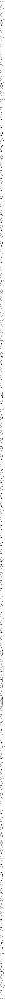

In [19]:
from IPython import display
display.Image('name_to_titles.png')

In [20]:
same_title_dict = {}
unique_title_list = []
for x in names_title_dict:
#     print((x))
    for unique_title in names_title_dict[x]:
        if unique_title not in unique_title_list:
            unique_title_list.append(unique_title)
    per_title_name_list = []
    for i in unique_title_list:
        
        if names_title_dict[x] == i:
            
            per_title_name_list.append(name_titles_dict[x])
        same_title_dict[i] = per_title_name_list
name = names_title_dict.keys()
title = same_title_dict.keys()
for title in same_title_dict:
#     print(title)
    name_list = []
#     print(name)
    for name in names_title_dict:
        if str(title) in names_title_dict[name] and name not in name_list:
#             print(name,title)
            name_list.append(name)
    same_title_dict[title] = name_list
            #     same_title_dict[title] = list((name))
same_title_dict

{'tt0077975': ['John Belushi'],
 'tt0080455': ['John Belushi', 'Dan Aykroyd'],
 'tt0078723': ['John Belushi'],
 'tt0072562': ['John Belushi',
  'Bill Murray',
  'Jim Belushi',
  'Dana Carvey',
  'Kevin Nealon',
  'Fred Armisen',
  'A. Whitney Brown',
  'Beth Cahill',
  'Pete Davidson',
  'Tom Davis',
  'Robin Duke',
  'Chris Elliott',
  'Al Franken',
  'Mary Gross',
  'Rich Hall',
  'Darrell Hammond',
  'Phil Hartman',
  'Yvonne Hudson',
  'Melanie Hutsell',
  'Leslie Jones',
  'Tim Kazurinsky',
  'Taran Killam',
  'Gary Kroeger',
  'Gail Matthius',
  'Kate McKinnon',
  'Tracy Morgan',
  'Garrett Morris',
  'Don Novello',
  "Michael O'Donoghue",
  'Joe Piscopo',
  'Amy Poehler',
  'Gilda Radner',
  'Jeff Richards',
  'Ann Risley',
  'Tim Robinson',
  'Tom Schiller',
  'Robert Smigel',
  'Kenan Thompson',
  'Dan Vitale',
  'Fred Wolf',
  'Alan Zweibel',
  'Seth Meyers',
  'Lauren Holt',
  'Bobby Moynihan',
  'Finesse Mitchell',
  'Mikey Day',
  'Andy Samberg',
  'Paul Brittain',
  'Coli

In [21]:
G = pgv.AGraph(same_title_dict,
               strict=True,
               directed=False,
               rankdir="RL",
               ranksep="0.25",
               ordering="in")

G.layout('dot')

G.draw('title_to_names.png')

G.draw('title_to_names.svg')

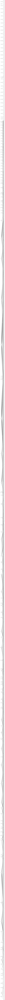

In [22]:
display.Image('title_to_names.png')

In [23]:
values = list(set([x for y in names_title_dict.values() for x in y]))
data = {}
for key in names_title_dict.keys():
    data[key] = [True if value in names_title_dict[key] else False for value in values]

boolean_table_name_cols = pd.DataFrame(data, index=values)
pd.DataFrame(boolean_table_name_cols)

,John Belushi,Dan Aykroyd,Bill Murray,Mike Myers,Chevy Chase,Billy Crystal,Joan Cusack,Robert Downey Jr.,Chris Farley,Janeane Garofalo,...,Ego Nwodim,Brooks Wheelan,Cecily Strong,Aidy Bryant,Chris Redd,Jim Downey,Bowen Yang,Andrew Dismukes,Siobhan Fallon,Punkie Johnson
tt11239422,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt1715425,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt14945492,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt9173436,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt2294677,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt7525600,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt1022605,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt1446714,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
tt0068892,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [24]:
# https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
values = list(set([x for y in same_title_dict.values() for x in y]))
data = {}
for key in same_title_dict.keys():
    data[key] = [ True if value in same_title_dict[key] else False for value in values]

boolean_table_title_cols = pd.DataFrame(data, index=values)
pd.DataFrame(boolean_table_title_cols)

,tt0077975,tt0080455,tt0078723,tt0072562,tt0087332,tt0097428,tt0118747,tt0335266,tt0499556,tt2357748,...,tt6078096,tt2452244,tt14508698,tt6279022,tt13858722,tt6463510,tt5117666,tt5821764,tt7778796,tt7242698
Martin Short,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Dana Carvey,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Harry Shearer,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Finesse Mitchell,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Patrick Weathers,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Laurie Metcalf,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Jim Downey,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Melissa Villaseñor,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Christopher Guest,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


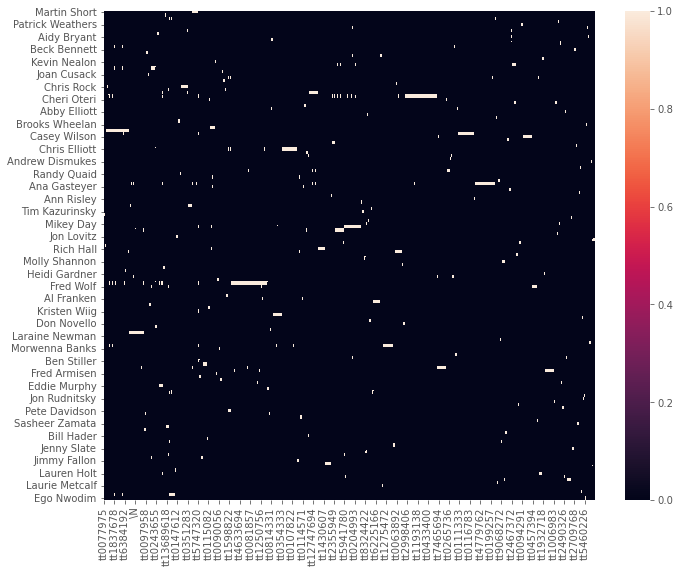

In [25]:
fig, ax = plt.subplots(figsize=(11, 9))
sb.heatmap(boolean_table_title_cols)
plt.show()

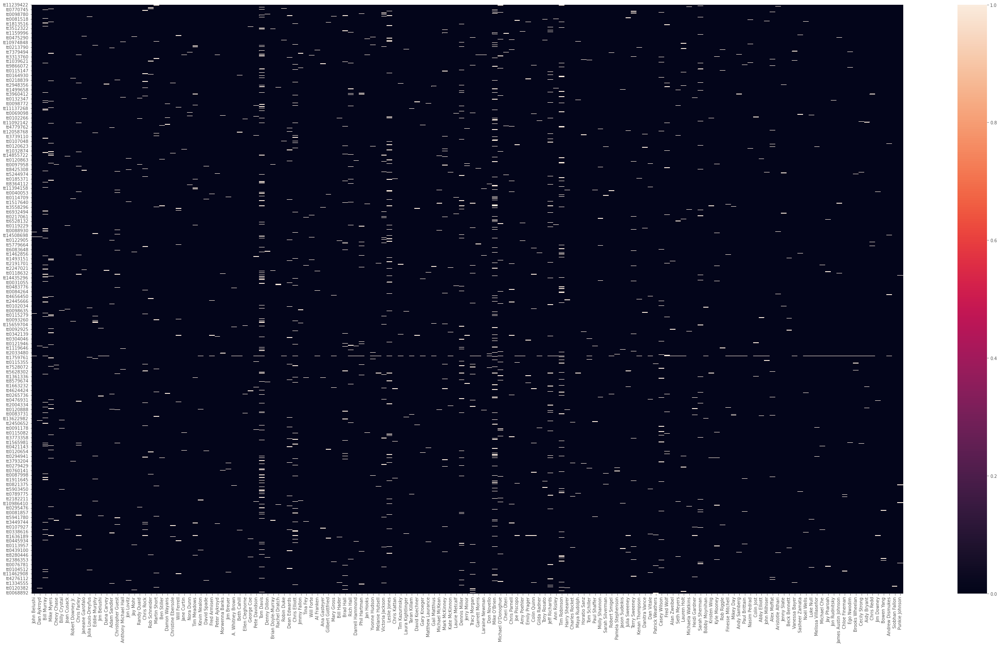

In [26]:
fig, ax = plt.subplots(figsize=(45, 25))
sb.heatmap(boolean_table_name_cols)
plt.show()

In [27]:
# ATTEMPT AT A NETWORK NODE GRAPH
# g = nx.DiGraph(same_title_dict)
# g.add_nodes_from(same_title_dict.keys())
# for k, v in same_title_dict.items():
#     g.add_edges_from(([(k, t) for t in v]))
#     node_trace = go.Scatter(
#     x=node_x, y=node_y,
#     mode='markers',
#     hoverinfo='text',
#     marker=dict(
#         showscale=True,
#         # colorscale options
#         #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
#         #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
#         #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
#         colorscale='YlGnBu',
#         reversescale=True,
#         color=[],
#         size=10,
#         colorbar=dict(
#             thickness=15,
#             title='Node Connections',
#             xanchor='left',
#             titleside='right'),
#         line_width=2))
# nx.draw(g,with_labels=True)

# node_adjacencies = []
# node_text = []
# for node, adjacencies in enumerate(g.adjacency()):
#     node_adjacencies.append(len(adjacencies[1]))
#     node_text.append('# of connections: '+str(len(adjacencies[1])))

# node_trace.marker.color = node_adjacencies
# node_trace.text = node_text
# # Create Network Graph
# fig = go.Figure(data=[edge_trace, node_trace],
#              layout=go.Layout(
#                 title='<br>Network graph made with Python',
#                 titlefont_size=24,
#                 showlegend=False,
#                 hovermode='closest',
#                 margin=dict(b=20,l=5,r=5,t=40),
#                 annotations=[ dict(
#                     text="Python code: <a href='https://plotly.com/ipython-notebooks/network-graphs/'> https://plotly.com/ipython-notebooks/network-graphs/</a>",
#                     showarrow=False,
#                     xref="paper", yref="paper",
#                     x=0.005, y=-0.002 ) ],
#                 xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
#                 yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))                )
# fig.show()

John Belushi ['tt0077975', 'tt0080455', 'tt0078723', 'tt0072562']
John Belushi
[True, True, True, True]
Dan Aykroyd
[False, True, False, False]
Bill Murray
[False, False, False, True]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[False, False, False, True]
Dana Carvey
[False, False, False, True]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Mart

Kyle Mooney
[False, False, False, False]
Rob Riggle
[False, False, False, False]
Finesse Mitchell
[False, False, False, False]
Mikey Day
[False, False, False, False]
Andy Samberg
[False, False, False, False]
Paul Brittain
[False, False, False, False]
Nasim Pedrad
[False, False, False, False]
Colin Jost
[False, False, False, False]
Abby Elliott
[False, False, False, False]
John Milhiser
[False, False, False, False]
Alex Moffat
[False, False, False, False]
Aristotle Athari
[False, False, False, False]
Jenny Slate
[False, False, False, False]
Beck Bennett
[False, False, False, False]
Vanessa Bayer
[False, False, False, False]
Sasheer Zamata
[False, False, False, False]
Noël Wells
[False, False, False, False]
Luke Null
[False, False, False, False]
Melissa Villaseñor
[False, False, False, False]
Michael Che
[False, False, False, False]
Jay Pharoah
[False, False, False, False]
Jon Rudnitsky
[False, False, False, False]
James Austin Johnson
[False, False, False, False]
Chloe Fineman
[False, F

Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Martin Short
[False, False, False, False]
Ben Stiller
[False, False, False, False]
Damon Wayans
[False, False, False, False]
Christine Ebersole
[False, False, False, False]
Will Ferrell
[False, False, False, False]
Jane Curtin
[False, False, False, False]
Nora Dunn
[False, False, False, False]
Tim Meadows
[False, False, False, False]
Kevin Nealon
[False, False, True, False]
David Spade
[False, False, False, False]
Fred Armisen
[False, False, True, False]
Peter Aykroyd
[False, False, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[False, False, True, False]
Beth Cahill
[False, False, True, False]
Ellen Cleghorne
[False, False, False, False]
George Coe
[False, False, False, False]
Pete Davidson
[False, False, True, False]


[False, False, False, False]
David Koechner
[False, False, False, False]
Gary Kroeger
[False, False, False, False]
Matthew Laurance
[False, False, False, False]
Gail Matthius
[False, False, False, False]
Michael McKean
[False, False, False, False]
Mark McKinney
[False, False, False, False]
Kate McKinnon
[False, False, False, False]
Laurie Metcalf
[False, False, False, False]
Dennis Miller
[False, False, False, False]
Jerry Minor
[False, False, False, False]
Tracy Morgan
[False, False, False, False]
Garrett Morris
[False, False, False, False]
Laraine Newman
[False, False, False, False]
Don Novello
[False, False, False, False]
Mike O'Brien
[False, False, False, False]
Michael O'Donoghue
[False, False, False, False]
Cheri Oteri
[False, False, False, False]
Chris Parnell
[False, False, False, False]
Joe Piscopo
[False, False, False, False]
Amy Poehler
[False, False, False, False]
Emily Prager
[False, False, False, False]
Colin Quinn
[False, False, False, False]
Gilda Radner
[False, False, 

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Sarah Sherman
[False, False, False, False]
Bobby Moynihan
[False, False, False, False]
Kristen Wiig
[False, False, False, False]
Kyle Mooney
[False, False, False, False]
Rob Riggle
[False, False, False, False]
Finesse Mitchell
[False, False, False, False]
Mikey Day
[False, False, False, False]
Andy Samberg
[False, False, False, False]
Paul Brittain
[False, False, False, False]
Nasim Pedrad
[False, False, False, False]
Colin Jost
[False, False, False, False]
Abby Elliott
[False, False, False, False]
John Milhiser
[False, False, False, False]
Alex Moffat
[False, False, False, False]
Aristotle Athari
[False, False, False, False]
Jenny Slate
[False, False, False, False]
Beck Bennett
[False, False, False, False]
Vanessa Bayer
[False, False, False, False]
Sasheer Zamata
[False, False, False, False]
Noël Wells
[False, False, False, False]
Luke Null
[False, False, False, False]
Melissa Villaseñor
[False, False, False, False]
Michael Che
[False, False, False, False]
Jay Pharoah
[False, False, F

[False, False, False, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, True]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Martin Short
[False, False, False, False]
Ben Stiller
[False, False, False, False]
Damon Wayans
[False, False, False, False]
Christine Ebersole
[False, False, False, False]
Will Ferrell
[False, False, False, False]
Jane Curtin
[False, False, False, False]
Nora Dunn
[False, False, False, False]
Tim Meadows
[False, False, False, False]
Kevin Nealon
[False, False, False, False]
David Spade
[True, True, True, True]
Fred Armisen
[False, False, False, False]
Peter Aykroyd
[False, False, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[False, False, False, False]
B

[False, False, True, False]
Alex Moffat
[False, False, False, False]
Aristotle Athari
[False, False, False, False]
Jenny Slate
[False, False, False, False]
Beck Bennett
[False, False, False, False]
Vanessa Bayer
[False, False, True, False]
Sasheer Zamata
[False, False, False, False]
Noël Wells
[False, False, True, False]
Luke Null
[False, False, True, False]
Melissa Villaseñor
[False, False, True, False]
Michael Che
[False, False, True, False]
Jay Pharoah
[False, False, True, False]
Jon Rudnitsky
[False, False, True, False]
James Austin Johnson
[False, False, True, False]
Chloe Fineman
[False, False, True, False]
Ego Nwodim
[False, False, True, False]
Brooks Wheelan
[False, False, True, False]
Cecily Strong
[False, False, True, False]
Aidy Bryant
[False, False, True, False]
Chris Redd
[False, False, True, False]
Jim Downey
[False, False, False, False]
Bowen Yang
[False, False, False, False]
Andrew Dismukes
[False, False, True, False]
Siobhan Fallon
[False, False, False, False]
Punkie J

Christine Ebersole
[False, False, False, False]
Will Ferrell
[False, False, False, False]
Jane Curtin
[False, False, False, False]
Nora Dunn
[False, False, False, False]
Tim Meadows
[False, False, False, False]
Kevin Nealon
[False, False, False, False]
David Spade
[False, False, False, False]
Fred Armisen
[False, False, False, False]
Peter Aykroyd
[False, False, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[False, False, False, False]
Beth Cahill
[False, False, False, False]
Ellen Cleghorne
[False, False, False, False]
George Coe
[False, False, False, False]
Pete Davidson
[False, False, False, False]
Tom Davis
[False, False, False, False]
Denny Dillon
[True, True, True, True]
Brian Doyle-Murray
[False, False, False, False]
Rachel Dratch
[False, False, False, False]
Robin Duke
[False, False, False, False]
Dean Edwards
[False, False, False, False]
Chris Elliott
[False, False, False, False]
Jimmy Fallon
[False, False, F

Dennis Miller
[False, False, False, False, False]
Jerry Minor
[False, False, False, False, False]
Tracy Morgan
[False, False, False, False, False]
Garrett Morris
[False, False, False, False, False]
Laraine Newman
[False, False, False, False, False]
Don Novello
[False, False, False, False, False]
Mike O'Brien
[False, False, False, False, False]
Michael O'Donoghue
[False, False, False, False, False]
Cheri Oteri
[False, False, False, False, False]
Chris Parnell
[False, False, False, False, False]
Joe Piscopo
[False, False, False, False, False]
Amy Poehler
[False, False, False, False, False]
Emily Prager
[False, False, False, False, False]
Colin Quinn
[False, False, False, False, False]
Gilda Radner
[False, False, False, False, False]
Tony Rosato
[False, False, False, False, False]
Jeff Richards
[False, False, False, False, False]
Ann Risley
[False, False, False, False, False]
Tim Robinson
[False, False, False, False, False]
Harry Shearer
[False, False, False, False, False]
Charles Rocket


[False, True, False, False, False]
Nasim Pedrad
[False, False, False, False, False]
Colin Jost
[False, True, False, False, False]
Abby Elliott
[False, True, False, False, False]
John Milhiser
[False, True, False, False, False]
Alex Moffat
[False, False, False, False, False]
Aristotle Athari
[False, False, False, False, False]
Jenny Slate
[False, False, False, False, False]
Beck Bennett
[False, False, False, False, False]
Vanessa Bayer
[False, True, False, False, False]
Sasheer Zamata
[False, False, False, False, False]
Noël Wells
[False, True, False, False, False]
Luke Null
[False, True, False, False, False]
Melissa Villaseñor
[False, True, False, False, False]
Michael Che
[False, True, False, False, False]
Jay Pharoah
[False, True, False, False, False]
Jon Rudnitsky
[False, True, False, False, False]
James Austin Johnson
[False, True, False, False, False]
Chloe Fineman
[False, True, False, False, False]
Ego Nwodim
[False, True, False, False, False]
Brooks Wheelan
[False, True, False, 

[False, False, False, False, False, False, False]
Ben Stiller
[False, False, False, False, False, False, False]
Damon Wayans
[False, False, False, False, False, False, False]
Christine Ebersole
[False, False, False, False, False, False, False]
Will Ferrell
[False, False, False, False, False, False, False]
Jane Curtin
[False, False, False, False, False, False, False]
Nora Dunn
[False, False, False, False, False, False, False]
Tim Meadows
[False, False, False, False, False, False, False]
Kevin Nealon
[False, False, True, False, False, False, False]
David Spade
[False, False, False, False, False, False, False]
Fred Armisen
[False, False, True, False, False, False, False]
Peter Aykroyd
[False, False, False, False, False, False, False]
Morwenna Banks
[False, False, False, False, False, False, False]
Jim Breuer
[False, False, False, False, False, False, False]
A. Whitney Brown
[False, False, True, False, False, False, False]
Beth Cahill
[False, False, True, False, False, False, False]
Ellen 

[False, False, False, False]
Kate McKinnon
[False, False, False, False]
Laurie Metcalf
[False, False, False, False]
Dennis Miller
[False, False, False, False]
Jerry Minor
[False, False, False, False]
Tracy Morgan
[False, False, False, False]
Garrett Morris
[False, False, False, False]
Laraine Newman
[False, False, False, False]
Don Novello
[False, False, False, False]
Mike O'Brien
[False, False, False, False]
Michael O'Donoghue
[False, False, False, False]
Cheri Oteri
[False, False, False, False]
Chris Parnell
[False, False, False, False]
Joe Piscopo
[False, False, False, False]
Amy Poehler
[False, False, False, False]
Emily Prager
[False, False, False, False]
Colin Quinn
[False, False, False, False]
Gilda Radner
[False, False, False, False]
Tony Rosato
[False, False, False, False]
Jeff Richards
[False, False, False, False]
Ann Risley
[False, False, False, False]
Tim Robinson
[False, False, False, False]
Harry Shearer
[False, False, False, False]
Charles Rocket
[False, False, False, Fa

Mark McKinney ['tt0107927', 'tt5441646', 'tt1216491', 'tt2954994', 'tt6225166', 'tt3739110', 'tt1159996', 'tt0096626', 'tt0277370', 'tt3644198', 'tt0795461', 'tt0387779', 'tt4823678', 'tt6285944', 'tt1179069', 'tt0120770', 'tt1212450', 'tt1731701']
John Belushi
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Dan Aykroyd
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Bill Murray
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Mike Myers
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Chevy Chase
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Billy Crystal
[False, False, False, False, False, False,

Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Martin Short
[False, False, False, False]
Ben Stiller
[False, False, False, False]
Damon Wayans
[False, False, False, False]
Christine Ebersole
[False, False, False, False]
Will Ferrell
[False, False, False, False]
Jane Curtin
[False, True, False, False]
Nora Dunn
[False, False, False, False]
Tim Meadows
[False, False, False, False]
Kevin Nealon
[False, False, False, False]
David Spade
[False, False, False, False]
Fred Armisen
[False, False, False, False]
Peter Aykroyd
[False, True, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[False, False, False, False]
Beth Cahill
[False, False, False, False]
Ellen Cleghorne
[False, False, False, False]
George Coe
[False, False, False, False]
Pete Davidson
[False, False, False, Fals

Joe Piscopo ['tt7604526', 'tt0072562', 'tt0092226', 'tt0094961', 'tt0087507', '\\N']
John Belushi
[False, True, False, False, False, False]
Dan Aykroyd
[False, False, False, False, False, False]
Bill Murray
[False, True, False, False, False, False]
Mike Myers
[False, False, False, False, False, True]
Chevy Chase
[False, False, False, False, False, False]
Billy Crystal
[False, False, False, False, False, False]
Joan Cusack
[False, False, False, False, False, False]
Robert Downey Jr.
[False, False, False, False, False, False]
Chris Farley
[False, False, False, False, False, True]
Janeane Garofalo
[False, False, False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False, False, False]
Eddie Murphy
[False, False, False, False, False, False]
Jim Belushi
[False, True, False, False, False, False]
Dana Carvey
[False, True, False, False, False, False]
Adam Sandler
[False, False, False, False, False, False]
Christopher Guest
[False, False, False, False, False, False]
Anthony Mic

Ann Risley ['tt0082525', 'tt0081554', 'tt0081518', 'tt0072562']
John Belushi
[False, False, False, True]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[False, False, False, True]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[False, False, False, True]
Dana Carvey
[False, False, False, True]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Ma

Kenan Thompson
[True, False, False, False, False]
Danitra Vance
[False, False, False, False, False]
Dan Vitale
[True, False, False, False, False]
Patrick Weathers
[False, False, False, False, False]
Casey Wilson
[False, False, False, False, False]
Fred Wolf
[True, False, False, False, False]
Alan Zweibel
[True, False, False, False, False]
Seth Meyers
[True, False, False, False, False]
Lauren Holt
[True, False, False, False, False]
Michaela Watkins
[False, False, False, False, False]
Heidi Gardner
[False, False, False, False, False]
Sarah Sherman
[False, False, False, False, False]
Bobby Moynihan
[True, False, False, False, False]
Kristen Wiig
[False, False, False, False, False]
Kyle Mooney
[False, False, False, False, False]
Rob Riggle
[False, False, False, False, False]
Finesse Mitchell
[True, False, False, False, False]
Mikey Day
[True, False, False, False, False]
Andy Samberg
[True, False, False, False, False]
Paul Brittain
[True, False, False, False, False]
Nasim Pedrad
[False, Fal

[False, False, False, False, False, False]
Robin Duke
[False, False, False, False, False, False]
Dean Edwards
[False, False, False, False, False, False]
Chris Elliott
[False, False, False, False, True, False]
Jimmy Fallon
[False, False, False, False, False, False]
Tina Fey
[False, False, False, False, False, False]
Will Forte
[False, False, False, False, False, False]
Al Franken
[False, False, False, False, False, False]
Ana Gasteyer
[False, False, False, False, False, False]
Gilbert Gottfried
[False, False, False, False, False, False]
Mary Gross
[False, False, False, False, False, False]
Bill Hader
[False, False, False, False, False, False]
Brad Hall
[False, False, False, True, False, False]
Rich Hall
[False, False, False, False, False, False]
Darrell Hammond
[False, False, False, False, False, False]
Phil Hartman
[False, False, False, False, False, False]
Jan Hooks
[False, False, False, False, False, False]
Yvonne Hudson
[False, False, False, False, False, False]
Melanie Hutsell
[Fal

[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False]
Ego Nwodim
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False]
Brooks Wheelan
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False]
Cecily Strong
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False]
Aidy Bryant
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False]
Chris Redd
[False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False]
Jim Downey
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Bowen Yang
[False, False, False, False, False, False, False, False, False, False, False, Fal

Kristen Wiig ['tt0359950', 'tt1571249', 'tt1608290', 'tt1478338']
John Belushi
[False, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[False, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[False, False, False, False]
Dana Carvey
[False, False, False, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, Fal

Will Ferrell
[False, False, False, False]
Jane Curtin
[False, False, False, False]
Nora Dunn
[False, False, False, False]
Tim Meadows
[False, False, False, False]
Kevin Nealon
[False, False, False, False]
David Spade
[False, False, False, False]
Fred Armisen
[False, False, False, False]
Peter Aykroyd
[False, False, False, False]
Morwenna Banks
[False, False, False, False]
Jim Breuer
[False, False, False, False]
A. Whitney Brown
[False, False, False, False]
Beth Cahill
[False, False, False, False]
Ellen Cleghorne
[False, False, False, False]
George Coe
[False, False, False, False]
Pete Davidson
[False, False, False, False]
Tom Davis
[False, False, False, False]
Denny Dillon
[False, False, False, False]
Brian Doyle-Murray
[False, False, False, False]
Rachel Dratch
[False, False, False, False]
Robin Duke
[False, False, False, False]
Dean Edwards
[False, False, False, False]
Chris Elliott
[False, False, False, False]
Jimmy Fallon
[False, False, False, False]
Tina Fey
[False, False, False, 

[False, False, False, False]
Jerry Minor
[False, False, False, False]
Tracy Morgan
[False, False, False, False]
Garrett Morris
[False, False, False, False]
Laraine Newman
[False, False, False, False]
Don Novello
[False, False, False, False]
Mike O'Brien
[False, False, False, False]
Michael O'Donoghue
[False, False, False, False]
Cheri Oteri
[False, False, False, False]
Chris Parnell
[False, False, False, False]
Joe Piscopo
[False, False, False, False]
Amy Poehler
[False, False, False, False]
Emily Prager
[False, False, False, False]
Colin Quinn
[False, False, False, False]
Gilda Radner
[False, False, False, False]
Tony Rosato
[False, False, False, False]
Jeff Richards
[False, False, False, False]
Ann Risley
[False, False, False, False]
Tim Robinson
[False, False, False, False]
Harry Shearer
[False, False, False, False]
Charles Rocket
[False, False, False, False]
Maya Rudolph
[False, False, False, False]
Horatio Sanz
[False, False, False, False]
Tom Schiller
[False, False, False, False]

Alex Moffat
[False, False, False, False]
Aristotle Athari
[False, False, False, False]
Jenny Slate
[False, False, False, False]
Beck Bennett
[False, False, False, False]
Vanessa Bayer
[False, False, False, True]
Sasheer Zamata
[False, False, False, False]
Noël Wells
[False, False, False, True]
Luke Null
[False, False, False, True]
Melissa Villaseñor
[False, False, False, True]
Michael Che
[True, True, True, True]
Jay Pharoah
[False, False, False, True]
Jon Rudnitsky
[False, False, False, True]
James Austin Johnson
[False, False, False, True]
Chloe Fineman
[False, False, False, True]
Ego Nwodim
[False, False, False, True]
Brooks Wheelan
[False, False, False, True]
Cecily Strong
[False, False, False, True]
Aidy Bryant
[False, False, False, True]
Chris Redd
[False, False, False, True]
Jim Downey
[False, False, False, False]
Bowen Yang
[False, False, False, False]
Andrew Dismukes
[False, False, False, True]
Siobhan Fallon
[False, False, False, False]
Punkie Johnson
[False, False, False, Fa

Tom Schiller
[False, False, True, False]
Paul Shaffer
[False, False, False, False]
Molly Shannon
[False, False, False, False]
Sarah Silverman
[False, False, False, False]
Robert Smigel
[False, False, True, False]
Pamela Stephenson
[False, False, False, False]
Jason Sudeikis
[False, False, False, False]
Julia Sweeney
[False, False, False, False]
Terry Sweeney
[False, False, False, False]
Kenan Thompson
[False, False, True, False]
Danitra Vance
[False, False, False, False]
Dan Vitale
[False, False, True, False]
Patrick Weathers
[False, False, False, False]
Casey Wilson
[False, False, False, False]
Fred Wolf
[False, False, True, False]
Alan Zweibel
[False, False, True, False]
Seth Meyers
[False, False, True, False]
Lauren Holt
[False, False, True, False]
Michaela Watkins
[False, False, False, False]
Heidi Gardner
[False, False, False, False]
Sarah Sherman
[False, False, False, False]
Bobby Moynihan
[False, False, True, False]
Kristen Wiig
[False, False, False, False]
Kyle Mooney
[False, F

Chris Redd ['tt0072562', 'tt3960412', 'tt7286456', 'tt5884792']
John Belushi
[True, False, False, False]
Dan Aykroyd
[False, False, False, False]
Bill Murray
[True, False, False, False]
Mike Myers
[False, False, False, False]
Chevy Chase
[False, False, False, False]
Billy Crystal
[False, False, False, False]
Joan Cusack
[False, False, False, False]
Robert Downey Jr.
[False, False, False, False]
Chris Farley
[False, False, False, False]
Janeane Garofalo
[False, False, False, False]
Julia Louis-Dreyfus
[False, False, False, False]
Eddie Murphy
[False, False, False, False]
Jim Belushi
[True, False, False, False]
Dana Carvey
[True, False, False, False]
Adam Sandler
[False, False, False, False]
Christopher Guest
[False, False, False, False]
Anthony Michael Hall
[False, False, False, False]
Jon Lovitz
[False, False, False, False]
Jay Mohr
[False, False, False, False]
Randy Quaid
[False, False, False, False]
Chris Rock
[False, False, False, False]
Rob Schneider
[False, False, False, False]
Ma

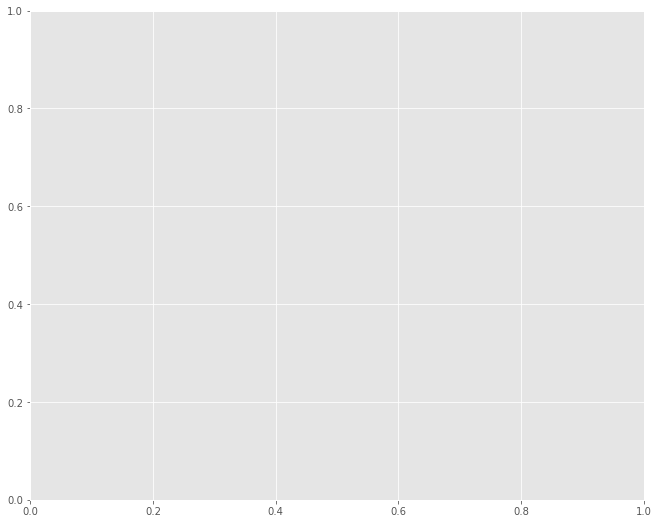

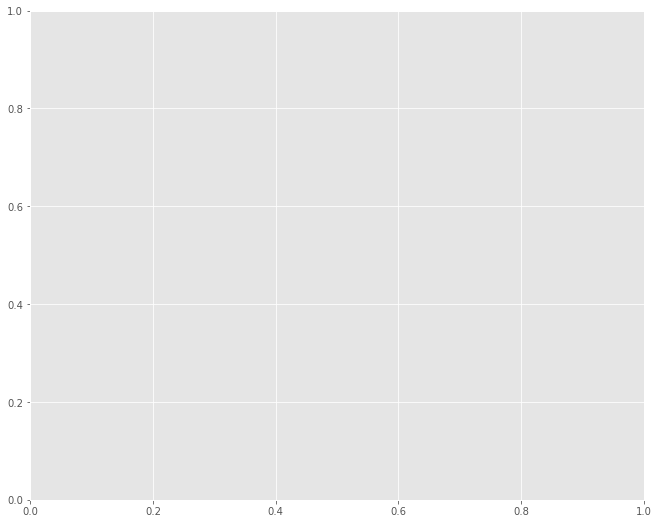

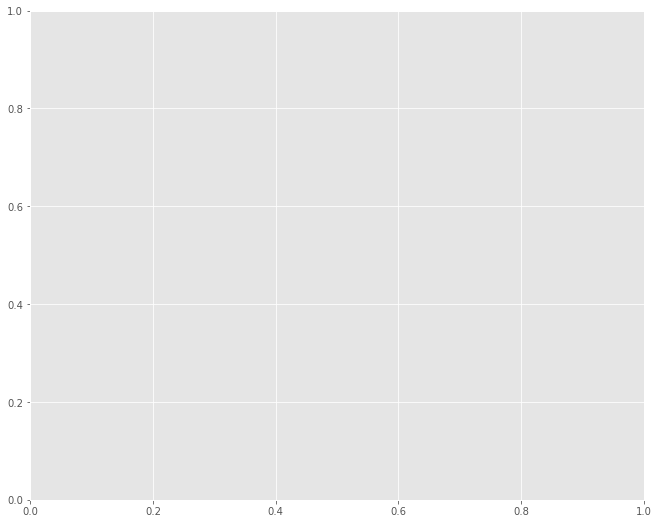

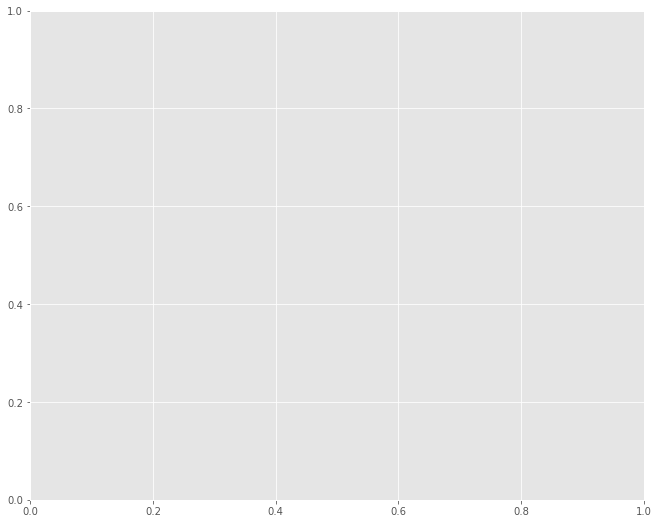

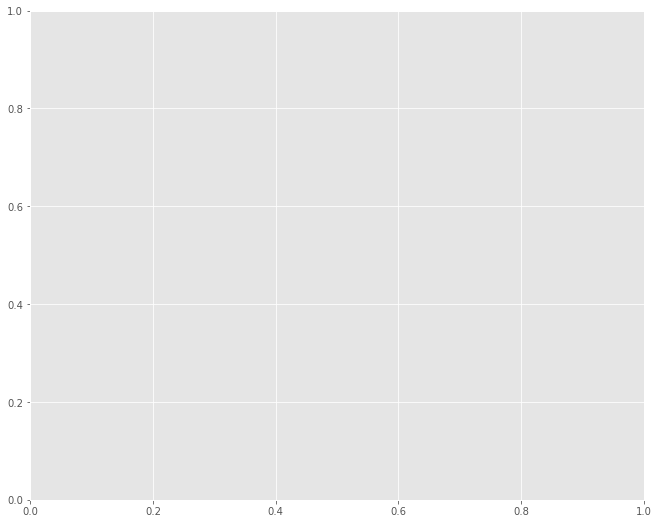

...

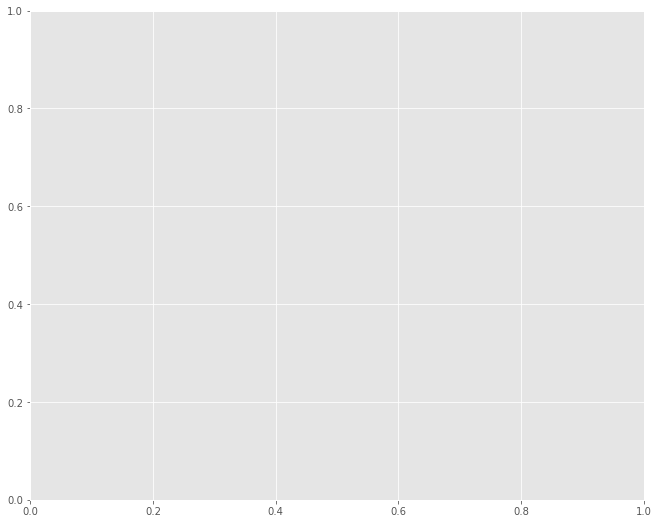

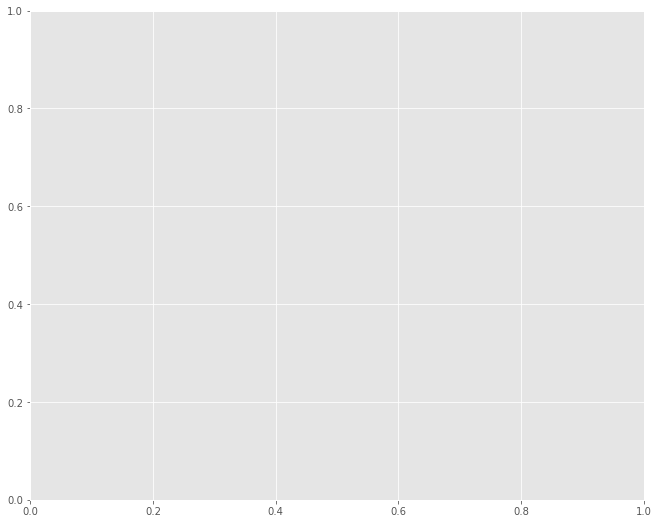

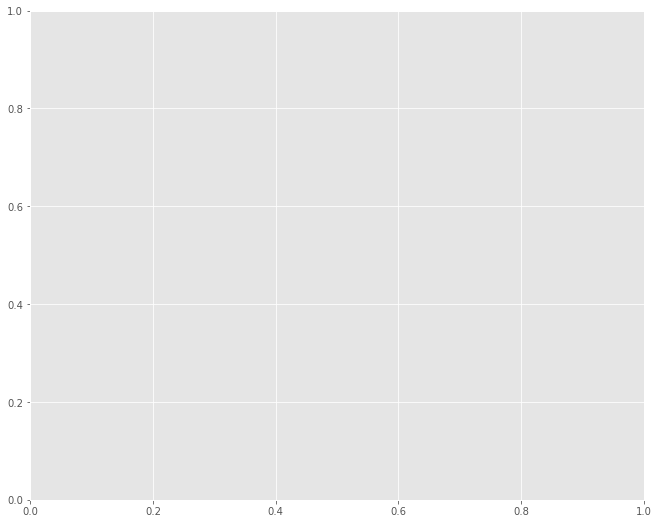

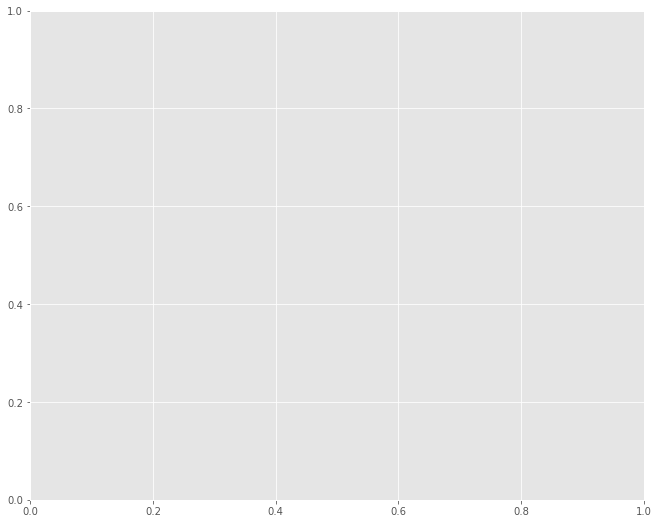

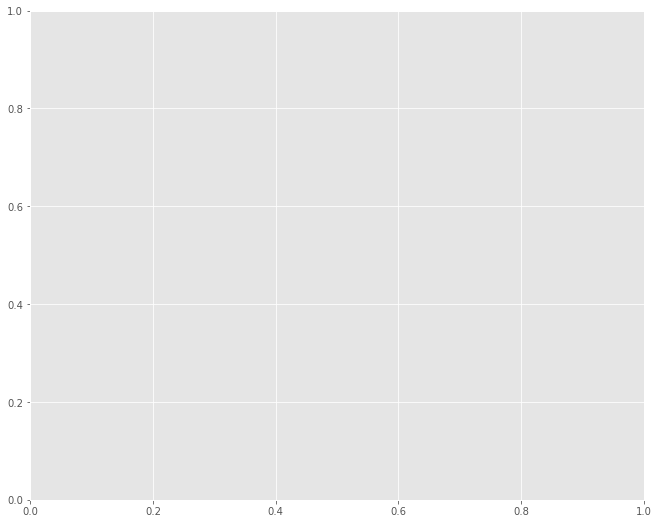

In [75]:
for actor in names_title_dict:
    fig, ax = plt.subplots(figsize=(11, 9))
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = names_title_dict[actor]
    print(actor,values)
    data = {}
    boolean_table_name_cols = pd.DataFrame(data, columns=values)

    for key in names_title_dict:
        print(key)
        data[actor] = [True if value in names_title_dict[key] else False for value in values]
        print(data[actor])
#         for index in boolean_table_name_cols:
#             boolean_table_name_cols.append(data[actor])
        boolean_table_name_cols
        
#         sb.heatmap(boolean_table_name_cols)
#     plt.GridSpec(boolean_table_title_cols,ncols=len(values))
#     plt.show()

In [76]:
data = {}
for actor in names_title_dict:
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = names_title_dict[actor]
    headers = values[:]
    headers.insert(0,actor)
#     print(headers)
#     print(values)

#     print(actor,values)
    
    actor_dict_2d = [headers]

    for key in names_title_dict:
#         print(key)
#         data[actor] = [True if value in names_title_dict[key] else False for value in values]
#         print(data[actor])
        t_or_f = [1 if value in names_title_dict[key] else 0 for value in values]
        t_or_f.insert(0,key)
        actor_dict_2d.append(t_or_f)
    data[actor] = actor_dict_2d
# print(data)

In [77]:
# table = pd.DataFrame(data['Kate McKinnon']).set_index(0)

# header = table.iloc[0]
# table.columns = header
# table = pd.DataFrame(table[1:], columns=header)
# wiki_cast.index

In [78]:
def create_table(i):
    table = pd.DataFrame(data[wiki_cast.iloc[i].name]).set_index(0)
    header = table.iloc[0]
    table.columns = header
    table = pd.DataFrame(table[1:], columns=header)
    return table
table = create_table(1)

In [122]:
wiki_cast = wiki_cast[::-1]
def on_selection(change):
    if (change['owner'].selected) is not None and len(change['owner'].selected)==1: # only allow user to select one grid
            i = change['owner'].selected[0]

            myLabel.value = wiki_cast.iloc[i].name + ': ' + str(wiki_cast.iloc[i]['No. of seasons']) + ' seasons on SNL'
            table = create_table(i)
            heat_map.color = table.values.astype('float')
            heat_map.row = table.index.values.astype(str),
            heat_map.column = table.columns.values.astype(str)
#how to ignore if NoneType selected?

In [123]:
myLabel = ipywidgets.Label()

In [124]:
####### BAR PLOT ######
# 2. scales
x_scb = bqplot.OrdinalScale()
y_scb = bqplot.LinearScale()
# 3. axis 
x_axb = bqplot.Axis(label='SNL Cast Member', orientation = 'vertical',
                    scale=x_scb, label_offset = '115px',
                    tick_style={'font-size':'3px','text-anchor': 'end'},
                    padding = 0.25)
y_axb = bqplot.Axis(label='Number of Seasons on SNL',
                    scale=y_scb, label_offset = '40 px')

# 4. mark -- heatmap using out colors to map our data
no_SNL_seasons_bar = bqplot.Bars(orientation='horizontal',x=wiki_cast.index,
                                 y=wiki_cast['No. of seasons'],
                                 align='center',scales = {'x':x_scb,
                                                          'y':y_scb},
                                 interactions={"click": "select"},
                                 selected_style={"stroke": "green", 
                                                 "fill": "skyblue"})


margin = dict(top=0, bottom=50, left=140, right=0)


no_SNL_seasons_bar.observe(on_selection,'selected')

fig_bars = bqplot.Figure(marks=[no_SNL_seasons_bar],
                         axes=[x_axb, y_axb], fig_margin=margin)
fig_bars.axes[0].tick_style = {'text-anchor': 'end'}

fig_bars.layout.height = '1700px'
fig_bars.layout.width = '550px'
fig_bars

Figure(axes=[Axis(label='SNL Cast Member', label_offset='115px', orientation='vertical', scale=OrdinalScale(),…

In [125]:
table.values.astype(int)

array([[1, 1, 1, ..., 1, 1, 1],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [0, 1, 1, ..., 1, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0]])

In [126]:
##GRID HEAT MAP##

# 2. scales
col_sc = bqplot.OrdinalColorScale(scheme="Pastel1")
x_sc = bqplot.OrdinalScale()
y_sc = bqplot.OrdinalScale()

# 3. axis
col_ax = bqplot.ColorAxis(scale=col_sc, orientation='horizontal', side='top', label = 'Color Scale')
x_ax = bqplot.Axis(scale=x_sc, label='Title IDs',tick_rotate=-90, tick_style ={'font-size':'8px'},  label_offset ='50px')
y_ax = bqplot.Axis(scale=y_sc, orientation='vertical', label='Actors',tick_offset = '50px',tick_style ={'font-size':'8px'}, label_offset ='50px')

# 4. marks
heat_map = bqplot.GridHeatMap(color = table.values.astype('float'),
                             row = table.index.values.astype(str),
                             column = table.columns.values.astype(str),scales = {'color': col_sc})

fig = bqplot.Figure(marks=[heat_map], axes=[col_ax,x_ax, y_ax])
fig.layout.height = '1700px'
fig.layout.width = '550px'

In [127]:
Label_bar = ipywidgets.VBox([myLabel,fig_bars])
myDashboard = ipywidgets.HBox([Label_bar,fig])
myDashboard

My dashboard is used to see the frequency of collaboration amongst SNL cast members. The left part of the graph is a bar chart, representing the length of tenure at SNL. When a user clicks on a cast member's bar, the heat map on the right gets updated. At the moment, the order is inconsistent between the two portions of the graph. This iteration of the heat map is more of a representation of the overlap between IMDb 'Known For Titles,' which are the group of four or five top titles on an actor's (or director, producer, etc.) resume/page. I've also opted not to include the titles since they are currently just IMDb unique title IDs and wouldn't mean anything to a viewer. I am in the process of compiling the complete list of titles for every SNL cast member by scraping their wikipedia filmography tables (the file in which I do that is included in the zipped submission file). The next iteration of my dashboard will hopefully include these complete lists for each actor. I also plan to include a hover interaction feature for the heat map where a label will be updated to show the comparative actor's name in addition to the project that each box represents. In the current iteration, the row which is filled in completely filled in green represents the row of the actor whose bar was just selected.

In [38]:
import wiki_scrape

Mapleworth Murders[2]
Mapleworth Murders
Fred Armisen's Guide to Dance and Self-Defense[1]
Fred Armisen's Guide to Dance and Self-Defense
Good Mourning[94]
Good Mourning
Hubie Halloween[44]
Hubie Halloween
Younger[34][35]
Younger
Beverly Hills Cop II[65]
Beverly Hills Cop II
Saturday Night Live[65]
Saturday Night Live
Family[56]
Family
Hubie Halloween[5]
Hubie Halloween
Mapleworth Murders[6]
Mapleworth Murders
Mapleworth Murders[71]
Mapleworth Murders
The Amber Ruffin Show[72]
The Amber Ruffin Show
Scoob![57]
Scoob!
Armstrong[60]
Armstrong
Mapleworth Murders[11]
Mapleworth Murders
Nickelodeon's Unfiltered[16]
Nickelodeon's Unfiltered
Hubie Halloween[23]
Hubie Halloween
Fargo[3]
Fargo
Mapleworth Murders[33]
Mapleworth Murders
Eater's Guide to the World[34]
Eater's Guide to the World
Mapleworth Murders[49]
Mapleworth Murders
Uncut Gems[5]
Uncut Gems
Home Movie: The Princess Bride[7]
Home Movie: The Princess Bride
Clifford the Big Red Dog[11]
Clifford the Big Red Dog
Home Movie: The Princ

In [39]:
wiki_cast.index

Index(['Fred Armisen', 'Aristotle Athari', 'Dan Aykroyd', 'Peter Aykroyd',
       'Morwenna Banks', 'Vanessa Bayer', 'Jim Belushi', 'John Belushi',
       'Beck Bennett', 'Jim Breuer',
       ...
       'Damon Wayans', 'Patrick Weathers', 'Noël Wells', 'Brooks Wheelan',
       'Kristen Wiig', 'Casey Wilson', 'Fred Wolf', 'Bowen Yang',
       'Sasheer Zamata', 'Alan Zweibel'],
      dtype='object', name='Performer', length=159)

In [88]:
order = list(wiki_cast.index)
SNL_Cast_Members_Full_Titles_dict = sorted((wiki_scrape.Final_dict).items(), key=lambda pair: order.index(pair[0]))
SNL_Cast_Members_Full_Titles_dict2 = {}
for i in SNL_Cast_Members_Full_Titles_dict:
    SNL_Cast_Members_Full_Titles_dict2[i[0]]=i[1]

SNL_Cast_Members_Full_Titles_dict2
SNL_Cast_Members_Full_Titles_dict = SNL_Cast_Members_Full_Titles_dict2

In [89]:
for i in SNL_Cast_Members_Full_Titles_dict.items():
    if 'Saturday Night Live' not in i[1]:
        i[1].append('Saturday Night Live')

In [90]:
same_title_dict = {}
unique_title_list = []
for x in SNL_Cast_Members_Full_Titles_dict:
#     print((x))
    for unique_title in SNL_Cast_Members_Full_Titles_dict[x]:
        if unique_title not in unique_title_list:
            unique_title_list.append(unique_title)
    per_title_name_list = []
    for i in unique_title_list:
        
        if SNL_Cast_Members_Full_Titles_dict[x] == i:
            
            per_title_name_list.append(SNL_Cast_Members_Full_Titles_dict[x])
        same_title_dict[i] = per_title_name_list
name = SNL_Cast_Members_Full_Titles_dict.keys()
title = same_title_dict.keys()
for title in same_title_dict:
#     print(title)
    name_list = []
#     print(name)
    for name in SNL_Cast_Members_Full_Titles_dict:
        if str(title) in SNL_Cast_Members_Full_Titles_dict[name] and name not in name_list:
#             print(name,title)
            name_list.append(name)
    same_title_dict[title] = name_list
            #     same_title_dict[title] = list((name))
same_title_dict

{'Love, Gilda': ['Alan Zweibel', 'Gilda Radner', 'Bill Hader'],
 'Dragnet': ['Alan Zweibel', 'Peter Aykroyd', 'Dan Aykroyd'],
 'Saturday Night Live': ['Alan Zweibel',
  'Sasheer Zamata',
  'Bowen Yang',
  'Fred Wolf',
  'Casey Wilson',
  'Kristen Wiig',
  'Brooks Wheelan',
  'Noël Wells',
  'Patrick Weathers',
  'Damon Wayans',
  'Michaela Watkins',
  'Nancy Walls',
  'Dan Vitale',
  'Melissa Villaseñor',
  'Danitra Vance',
  'Kenan Thompson',
  'Terry Sweeney',
  'Julia Sweeney',
  'Jason Sudeikis',
  'Cecily Strong',
  'Ben Stiller',
  'Pamela Stephenson',
  'David Spade',
  'Robert Smigel',
  'Jenny Slate',
  'Sarah Silverman',
  'Martin Short',
  'Sarah Sherman',
  'Harry Shearer',
  'Molly Shannon',
  'Paul Shaffer',
  'Rob Schneider',
  'Tom Schiller',
  'Horatio Sanz',
  'Adam Sandler',
  'Andy Samberg',
  'Maya Rudolph',
  'Jon Rudnitsky',
  'Tony Rosato',
  'Charles Rocket',
  'Chris Rock',
  'Tim Robinson',
  'Ann Risley',
  'Rob Riggle',
  'Jeff Richards',
  'Chris Redd',
  

In [91]:
values = list(set([x for y in SNL_Cast_Members_Full_Titles_dict.values() for x in y]))
data = {}
for key in SNL_Cast_Members_Full_Titles_dict.keys():
    data[key] = [True if value in SNL_Cast_Members_Full_Titles_dict[key] else False for value in values]
 
boolean_table_name_cols = pd.DataFrame(data, index=values)
pd.DataFrame(boolean_table_name_cols)

,Alan Zweibel,Sasheer Zamata,Bowen Yang,Fred Wolf,Casey Wilson,Kristen Wiig,Brooks Wheelan,Noël Wells,Patrick Weathers,Damon Wayans,...,Jim Breuer,Beck Bennett,John Belushi,Jim Belushi,Vanessa Bayer,Morwenna Banks,Peter Aykroyd,Dan Aykroyd,Aristotle Athari,Fred Armisen
NaN,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
The Great Buck Howard,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Diamonds,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
The Salon,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
The New Celebrity Apprentice,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Last Resort,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Hedgehogs,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
American Auto,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Manhattan,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Alan Zweibel ['Love, Gilda', 'Dragnet', 'Saturday Night Live', 'Monk', 'The Zen Diaries of Garry Shandling', 'The Last Laugh', 'North', 'Gilbert', 'Curb Your Enthusiasm', "It's Garry Shandling's Show", 'The Story of Us', 'Here Today']
John Belushi
[False, False, True, False, False, False, False, False, False, False, False, False]
Dan Aykroyd
[False, True, True, False, False, False, True, False, False, True, False, False]
Bill Murray
[False, False, True, False, False, False, False, False, False, False, False, False]
Mike Myers
[False, False, True, False, False, False, False, False, False, False, False, False]
Chevy Chase
[False, False, True, False, False, True, False, False, False, False, False, False]
Billy Crystal
[False, False, True, False, False, False, False, False, False, False, False, True]
Joan Cusack
[False, False, True, False, False, False, False, False, False, False, False, False]
Robert Downey Jr.
[False, False, True, False, False, False, False, False, False, False, False, F

Brooks Wheelan ['Random Tropical Paradise', "Those Who Can't", 'The Chris Gethard Show', 'To Tell the Truth', 'Saturday Night Live', 'Hawaii Five-0', 'The Half Hour', 'Big Hero 6: The Series', "Adam Devine's House Party", '@midnight', 'Girls', 'A.P. Bio', 'Better Off Single', 'The Attempt', 'Ridiculousness']
John Belushi
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False]
Dan Aykroyd
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False]
Bill Murray
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False]
Mike Myers
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False]
Chevy Chase
[False, False, False, False, True, False, False, False, False, False, False, False, False, False, False]
Billy Crystal
[False, False, False, False, True, False, False, False, False, False, False, False, False, 

[False, False, False, True, False, False, False, False, False]
Ben Stiller
[False, False, False, True, False, False, False, False, False]
Damon Wayans
[False, False, False, True, False, False, False, False, False]
Christine Ebersole
[False, False, False, True, False, False, False, False, False]
Will Ferrell
[False, False, False, True, False, False, False, True, False]
Jane Curtin
[False, False, False, True, False, False, False, False, False]
Nora Dunn
[False, False, False, True, False, False, False, False, False]
Tim Meadows
[False, False, False, True, False, False, False, True, False]
Kevin Nealon
[False, False, False, True, True, True, False, False, False]
David Spade
[False, False, False, True, False, False, False, False, False]
Fred Armisen
[False, False, False, True, False, False, False, False, False]
Peter Aykroyd
[False, False, False, True, False, False, False, False, False]
Morwenna Banks
[False, False, False, True, False, False, False, False, False]
Jim Breuer
[False, False, F

Mark McKinney
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, True, False, False, False, False]
Kate McKinnon
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Laurie Metcalf
[False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, True, False, False, False, False]
Dennis Miller
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Jerry Minor
[False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Tracy Morgan
[False, False, False, False, False, False, False

/Users/tzacks2/.conda/envs/DataViz2/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  



[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, True, False, False, False]
Bill Murray
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False]
Mike Myers
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, Fal

Harry Shearer ['Miami Vice', 'Animaniacs', 'The Salon', "It's a Great Life", 'A League of Their Own', 'Spitting Image: The Ronnie and Nancy Show', 'Chicken Little', 'The Big Uneasy', 'Speechless', 'Almost Heroes', 'Catching Up with Marty DiBergi', 'Death Valley Days', 'Love & Taxes', 'American Raspberry', 'Friends', 'Edwurd Fudwupper Fibbed Big', 'ER', 'Fernwood 2 Night', 'Haiku Tunnel', 'The Jack Benny Program', 'Saturday Night Live', 'The Visitor', 'The Fisher King', 'Flood Streets', "Wayne's World 2", 'Hometown Boy Makes Good', 'Out There', 'The Truman Show', 'Real Life', 'The Right Stuff', 'The T.V. Show', 'General Electric Theater', 'My Stepmother Is an Alien', 'The Agency', 'L.A. Law', 'Flicks', 'Sunday Best', 'Portrait of a White Marriage', 'One Trick Pony', 'Father Figures', 'Tracey Takes On...', 'Likely Stories, Vol. 1', "Merrill Markoe's Guide to Glamorous Living", 'Serpico', 'This Is Spinal Tap', "I'll Do Anything", 'George & Leo', 'Small Soldiers', 'Viva Shaf Vegas', 'MADtv

Robin Duke
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Dean Edwards
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, Fal

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False]
Andrew Dismukes
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False]
Siobhan Fallon
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False]
Punkie Johnson
[False, False, False, False, False, False, False, False, False, False, F

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, False, False]
Chris Kattan
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, False, False]
Tim Kazurinsky
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False]
Laura Kightlinger
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False]
Taran Killam
[True, False, False, False, False, False, True, False, False, False, False, False, False, False, False, True, False, False, True, True, False, False]
David Koechner
[True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False]
Gary Kroe

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False]
Nasim Pedrad
[False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, True, False, False]
Colin Jost
[False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False]
Abby Elliott
[False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False]
John Milhiser
[False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False]
Alex Moffat
[False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False]
Aristotle Athari
[False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False]
Jenny Slate
[False, False, False, Fals

Martin Short
[False, False, False, True, False, False, False, False]
Ben Stiller
[False, False, False, True, False, False, False, False]
Damon Wayans
[False, False, False, True, False, False, False, False]
Christine Ebersole
[False, False, False, True, False, False, False, False]
Will Ferrell
[False, False, False, True, False, False, False, False]
Jane Curtin
[False, False, False, True, False, False, False, False]
Nora Dunn
[False, False, False, True, False, False, False, False]
Tim Meadows
[False, False, False, True, False, False, False, False]
Kevin Nealon
[False, False, False, True, False, False, False, False]
David Spade
[False, False, True, True, False, False, False, False]
Fred Armisen
[False, False, True, True, False, False, False, False]
Peter Aykroyd
[False, False, False, True, False, False, False, False]
Morwenna Banks
[False, False, False, True, False, False, False, False]
Jim Breuer
[False, False, False, True, False, False, False, False]
A. Whitney Brown
[False, False, Fals

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Mark McKinney
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Kate McKinnon
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Laurie Metcalf
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Dennis Miller
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Jerry Minor
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False]
Tracy Morgan
[False, False, False, False, False, 

Gilbert Gottfried ['Super Gidget', 'Gender Bender', 'Married... with Children', 'The Ren & Stimpy Show', 'Mad About You', 'I Love Toys', "Escape from It's a Wonderful Life", 'Director’s Cut', 'Gilbert', "Mickey's House of Villains", '80s Creature House', 'In the House', 'Cosby', 'Hollywood Squares', 'Boy Band', "Def Jam's How to Be a Player", 'Duckman', "The Parent 'Hood", 'Problem Child', 'The Late Show with Stephen Colbert', 'A Wrestling Christmas Miracle', 'Comedy Central Roast: David Hasselhoff', "The Last Sharknado: It's About Time", 'Mighty Magiswords', "Late Night with Conan O'Brien", 'Never on Tuesday', 'Living Single', "Seth MacFarlane's Cavalcade of Cartoon Comedy", 'SpongeBob SquarePants', 'Hospital Arrest', 'Sesame Street', 'Clerks: The Animated Series', 'Farce of the Penguins', 'USA Up All Night', 'Saturday Night Live', 'Home Movies', 'The Tom and Jerry Show', 'The Aristocrats', 'Be Cool about Fire Safety!', 'Celebrity Wife Swap', 'Wings', "Look Who's Talking Too", 'Unbeli

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Randy Quaid
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, Fa

Robin Duke
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, False, False, False, False, False, False]
Dean Edwards
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False]
Chris Ellio

[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Billy Crystal
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False]
Joan Cusack
[False, False, False, False, False, 

[False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Kyle Mooney
[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, Fa

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



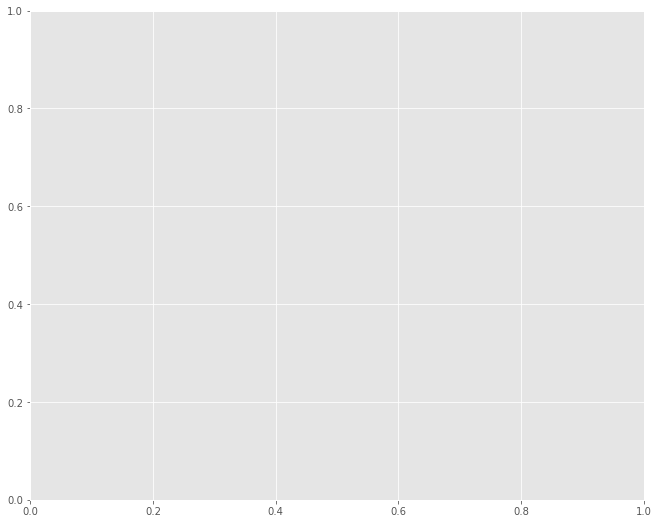

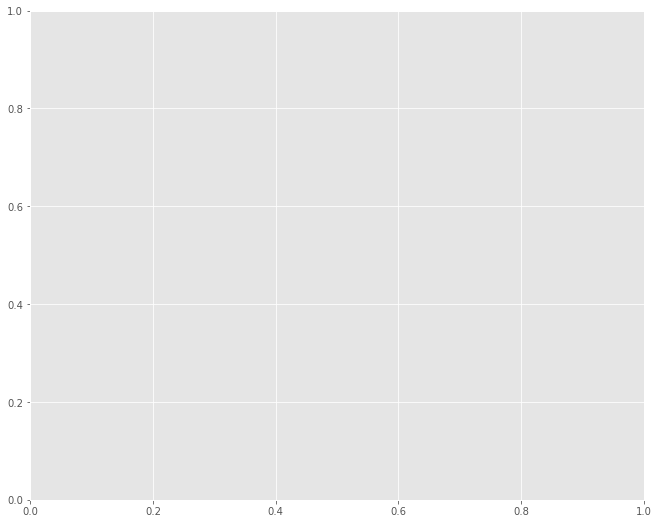

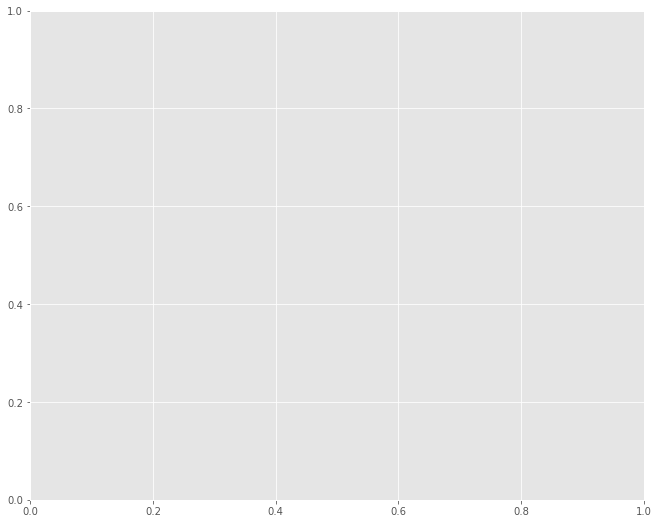

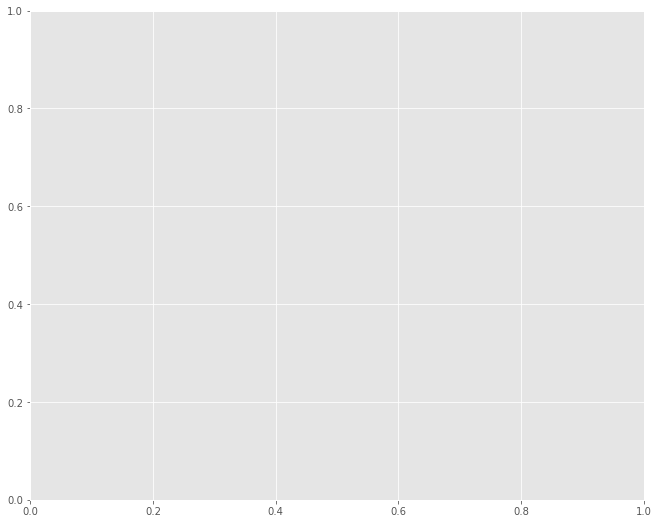

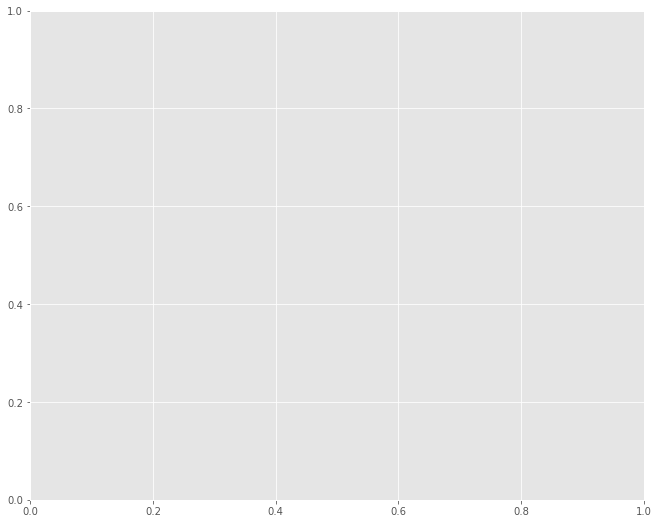

...

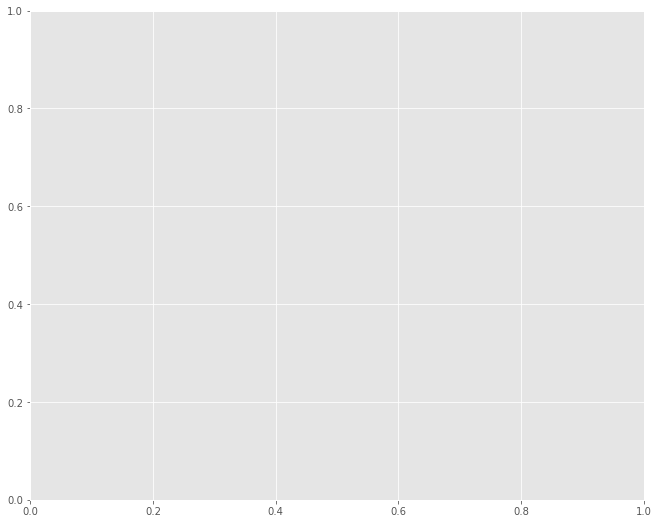

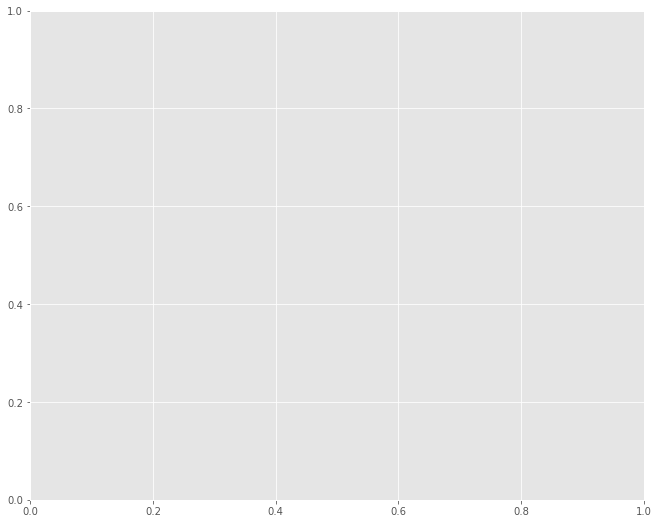

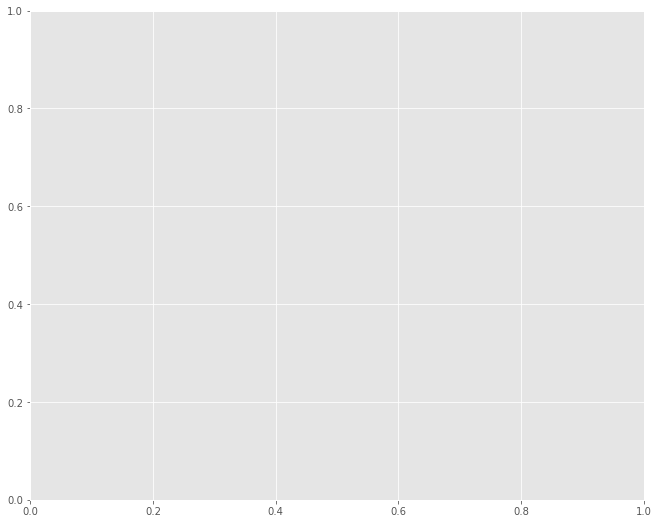

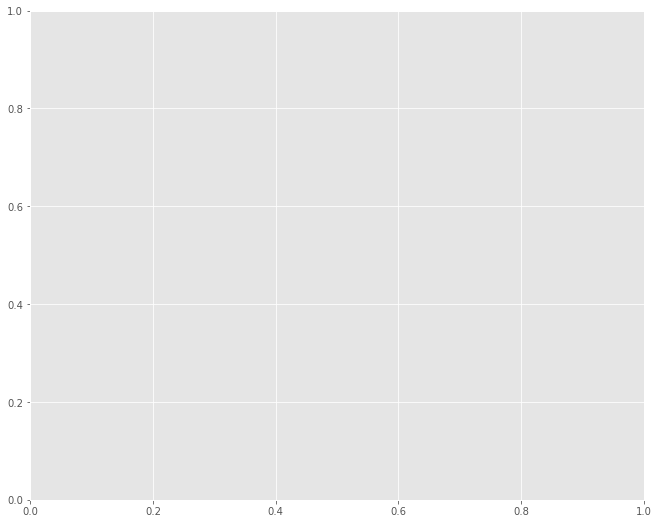

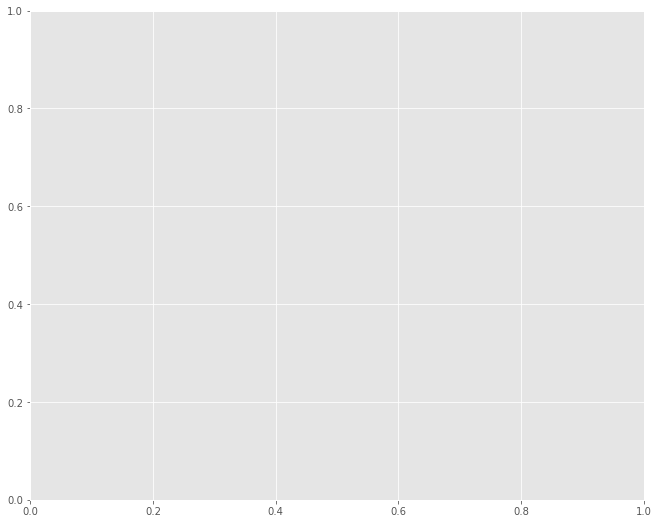

In [92]:
for actor in SNL_Cast_Members_Full_Titles_dict:
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = SNL_Cast_Members_Full_Titles_dict[actor]
    print(actor,values)
    data = {}
    boolean_table_name_cols = pd.DataFrame(data, columns=values)

    for key in names_title_dict:
        print(key)
        data[actor] = [True if value in SNL_Cast_Members_Full_Titles_dict[key] else False for value in values]
        print(data[actor])
#         for index in boolean_table_name_cols:
#             boolean_table_name_cols.append(data[actor])
        boolean_table_name_cols
        
#         sb.heatmap(boolean_table_name_cols)
#     plt.GridSpec(boolean_table_title_cols,ncols=len(values))
#     plt.show()

In [93]:
data = {}
for actor in SNL_Cast_Members_Full_Titles_dict:
    # https://stackoverflow.com/questions/41964618/boolean-matrix-form-pythons-dict-of-lists
    values = SNL_Cast_Members_Full_Titles_dict[actor]
    headers = values[:]
    headers.insert(0,actor)
#     print(headers)
#     print(values)

#     print(actor,values)
    
    actor_dict_2d = [headers]

    for key in SNL_Cast_Members_Full_Titles_dict:
#         print(key)
#         data[actor] = [True if value in names_title_dict[key] else False for value in values]
#         print(data[actor])
        t_or_f = [1 if value in SNL_Cast_Members_Full_Titles_dict[key] else 0 for value in values]
        t_or_f.insert(0,key)
        actor_dict_2d.append(t_or_f)
    data[actor] = actor_dict_2d
print(data)    
pd.DataFrame(data['Fred Armisen'])
# print(data)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,150
0,Fred Armisen,Cats & Dogs: The Revenge of Kitty Galore,The Ex,The Jim Gaffigan Show,Aqua Teen Hunger Force Colon Movie Film for Th...,The Sarah Silverman Program,30th Independent Spirit Awards,Lady Dynamite,Mapleworth Murders,Late Night with Jimmy Fallon,...,All Together Now,Tenacious D in The Pick of Destiny,Nature Cat,Next!,Deck the Halls,The Looney Tunes Show,Super Fun Night,Difficult People,"I Love You, America with Sarah Silverman",Like Mike
1,Alan Zweibel,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Sasheer Zamata,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Bowen Yang,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Fred Wolf,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,Morwenna Banks,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
156,Peter Aykroyd,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
157,Dan Aykroyd,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
158,Aristotle Athari,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [96]:
def create_table(i):
    table = pd.DataFrame(data[wiki_cast.iloc[i].name]).set_index(0)
    header = table.iloc[0]
    table.columns = header
    table = pd.DataFrame(table[1:], columns=header)
    return table
table = create_table(0)
table

Alan Zweibel,"Love, Gilda",Dragnet,Saturday Night Live,Monk,The Zen Diaries of Garry Shandling,The Last Laugh,North,Gilbert,Curb Your Enthusiasm,It's Garry Shandling's Show,The Story of Us,Here Today
0,,,,,,,,,,,,
Alan Zweibel,1,1,1,1,1,1,1,1,1,1,1,1
Sasheer Zamata,0,0,1,0,0,0,0,0,0,0,0,0
Bowen Yang,0,0,1,0,0,0,0,0,0,0,0,0
Fred Wolf,0,0,1,0,0,0,0,0,0,0,0,0
Casey Wilson,0,0,1,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
Morwenna Banks,0,0,1,0,0,0,0,0,0,0,0,0
Peter Aykroyd,0,1,1,0,0,0,0,0,0,0,0,0
Dan Aykroyd,0,1,1,0,0,0,1,0,0,1,0,0


In [128]:
myLabel = ipywidgets.Label()

In [129]:
wiki_cast = wiki_cast[::-1]
def on_selection(change):
    if (change['owner'].selected) is not None and len(change['owner'].selected)==1: # only allow user to select one grid
            i = change['owner'].selected[0]

            myLabel.value = wiki_cast.iloc[i].name + ': ' + str(wiki_cast.iloc[i]['No. of seasons']) + ' seasons on SNL'
            table = create_table(i)
            heat_map.color = table.values.astype('float')
            heat_map.row = table.index.values.astype(str),
            heat_map.column = table.columns.values.astype(str)
#how to ignore if NoneType selected?

In [130]:
####### BAR PLOT ######
# 2. scales
x_scb = bqplot.OrdinalScale()
y_scb = bqplot.LinearScale()
# 3. axis 
x_axb = bqplot.Axis(label='SNL Cast Member', orientation = 'vertical',
                    scale=x_scb, label_offset = '115px',
                    tick_style={'font-size':'3px','text-anchor': 'end'},
                    padding = 0.25)
y_axb = bqplot.Axis(label='Number of Seasons on SNL',
                    scale=y_scb, label_offset = '40 px')

# 4. mark -- heatmap using out colors to map our data
no_SNL_seasons_bar = bqplot.Bars(orientation='horizontal',x=wiki_cast.index,
                                 y=wiki_cast['No. of seasons'],
                                 align='center',scales = {'x':x_scb,
                                                          'y':y_scb},
                                 interactions={"click": "select"},
                                 selected_style={"stroke": "green", 
                                                 "fill": "skyblue"})


margin = dict(top=0, bottom=50, left=140, right=0)


no_SNL_seasons_bar.observe(on_selection,'selected')

fig_bars = bqplot.Figure(marks=[no_SNL_seasons_bar],
                         axes=[x_axb, y_axb], fig_margin=margin)
fig_bars.axes[0].tick_style = {'text-anchor': 'end'}

fig_bars.layout.height = '1700px'
fig_bars.layout.width = '500px'
fig_bars

Figure(axes=[Axis(label='SNL Cast Member', label_offset='115px', orientation='vertical', scale=OrdinalScale(),…

In [131]:
table.values.astype(int)

array([[1, 1, 1, ..., 1, 1, 1],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [0, 1, 1, ..., 1, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0]])

In [132]:
##GRID HEAT MAP##
# 2. scales
col_sc = bqplot.OrdinalColorScale(scheme = "Set2")
x_sc = bqplot.OrdinalScale()
y_sc = bqplot.OrdinalScale()

# 3. axis
col_ax = bqplot.ColorAxis(scale=col_sc, orientation='horizontal', side='top', label = 'Color Scale')
x_ax = bqplot.Axis(scale=x_sc, label='Title IDs',tick_rotate=-90, tick_style ={'font-size':'8px'},  label_offset ='50px')
y_ax = bqplot.Axis(scale=y_sc, orientation='vertical', label='Actors',tick_offset = '50px',tick_style ={'font-size':'8px'}, label_offset ='50px')

def_tt = bqplot.Tooltip(fields=["row", "column","color"])

# 4. marks
heat_map = bqplot.GridHeatMap(color = table.values.astype('float'),
                             row = table.index.values.astype(str),
                             column = table.columns.values.astype(str),scales = {'color': col_sc},
                             selected_style={"stroke": "green", 
                                                 "fill": "skyblue"},
                             tooltip=def_tt)


# 4 interactions
heat_map.interactions = {'hover': 'tooltip'}
fig = bqplot.Figure(marks=[heat_map], axes=[col_ax,x_ax, y_ax])
fig.layout.height = '1700px'
fig.layout.width = '550px'

In [121]:
Label_bar = ipywidgets.VBox([myLabel,fig_bars])
myDashboard = ipywidgets.HBox([Label_bar,fig])
myDashboard

In [ ]:
for i in "Set2"